<center><h2> Ongoing spatial redistribution of a globally stable ocean biological carbon pump </h2></center>
    
<center><h3> Figures </h3></center>

**L. Delaigue<sup>1,3</sup>, R. Sauzède<sup>3</sup>, G-J. Reichart<sup>1,2</sup>, H. Claustre<sup>3</sup>, O. Sulpis<sup>4</sup> and Matthew P. Humphreys<sup>1</sup>**

<sup>1</sup> Department of Ocean Systems (OCS), NIOZ Royal Netherlands Institute for Sea Research, PO Box 59, 1790 AB Den Burg (Texel), the Netherlands  

<sup>2</sup> Department of Earth Sciences, Utrecht University, 3584 CS Utrecht, The Netherlands

<sup>3</sup> Sorbonne Université, CNRS, Laboratoire d'Océanographie de Villefranche, LOV, 06230 Villefranche-sur-Mer, France

<sup>4</sup> CEREGE, Aix Marseille Univ, CNRS, IRD, INRAE, Collège de France, Aix-en-Provence, France

## Abstract

Marine dissolved inorganic carbon (DIC) is a key component of the global carbon cycle. Over recent decades, DIC has increased due to rising anthropogenic CO2, but the contribution of the biological carbon pump (BCP) — which transfers carbon from the surface to the deep ocean — remains poorly quantified. Using the GOBAI-O2 data product and machine learning algorithms, we reconstructed the global DIC distribution from 2004 to 2022 and decomposed it into DICsoft (BCP contribution), DICcarb (carbonate counter pump), and DICanth (anthropogenic CO2). We found a significant DIC increase, with surface waters rising at ~1.0 ± 0.23 μmol kg⁻¹ yr⁻¹, primarily driven by DICanth (>90% of the increase). While DICsoft showed no significant globally integrated trend, strong regional patterns were observed. Vertical and horizontal shifts in the BCP altered carbon sequestration, with enhanced carbon storage at shallower depths (i.e., stored on shorter timescales) in some regions and intensified sequestration at greater depths (i.e., stored on longer timescales) in others. Although this redistribution maintained a near-neutral BCP global trend, locally, strong regional changes could disrupt deep-water ecosystems, carbon storage in the ocean interior, and the BCP’s long-term role in the Earth's climate regulation.

**____________________________________________________________________________________________________________________________**


## Figure 1 
### Global mean rates of change in each DIC component as a function of pressure (dbar) within the first 2000m of the water column

This script analyzes the ocean’s **dissolved inorganic carbon (DIC) dynamics** using observational data and a **Monte Carlo simulation** to estimate uncertainties in its decomposition. The workflow includes:

**1. Data Loading & Preprocessing**
- Loads global ocean datasets, including **DIC**, **total alkalinity (TA)**, and **apparent oxygen utilization (AOU)**.
- Computes **absolute salinity**, **potential temperature**, and **density** using GSW equations.

**2. Monte Carlo Simulations**
- Perturbs **DIC, TA, and AOU** within their respective uncertainty ranges.
- Quantifies uncertainty in their long-term trends.

**3. Carbon Pump Contributions**
- Decomposes DIC trends into:
  - **DIC_soft** (biological soft tissue pump contribution)
  - **DIC_carb** (carbonate counter pump contribution)
  - **DIC_anth** (anthropogenic CO₂-driven increase)

**4. Global Mean Computation**
- Computes global trends by applying **weighted averaging** to account for the Earth's geometry.
- Uses **Welford’s online algorithm** to efficiently compute the **mean and variance** of DIC trends without storing all iterations in memory.
- Ensures accurate **error propagation** across Monte Carlo simulations.

**5. Results Export**
- Saves the final dataset, including **uncertainty estimates**, for further analysis.

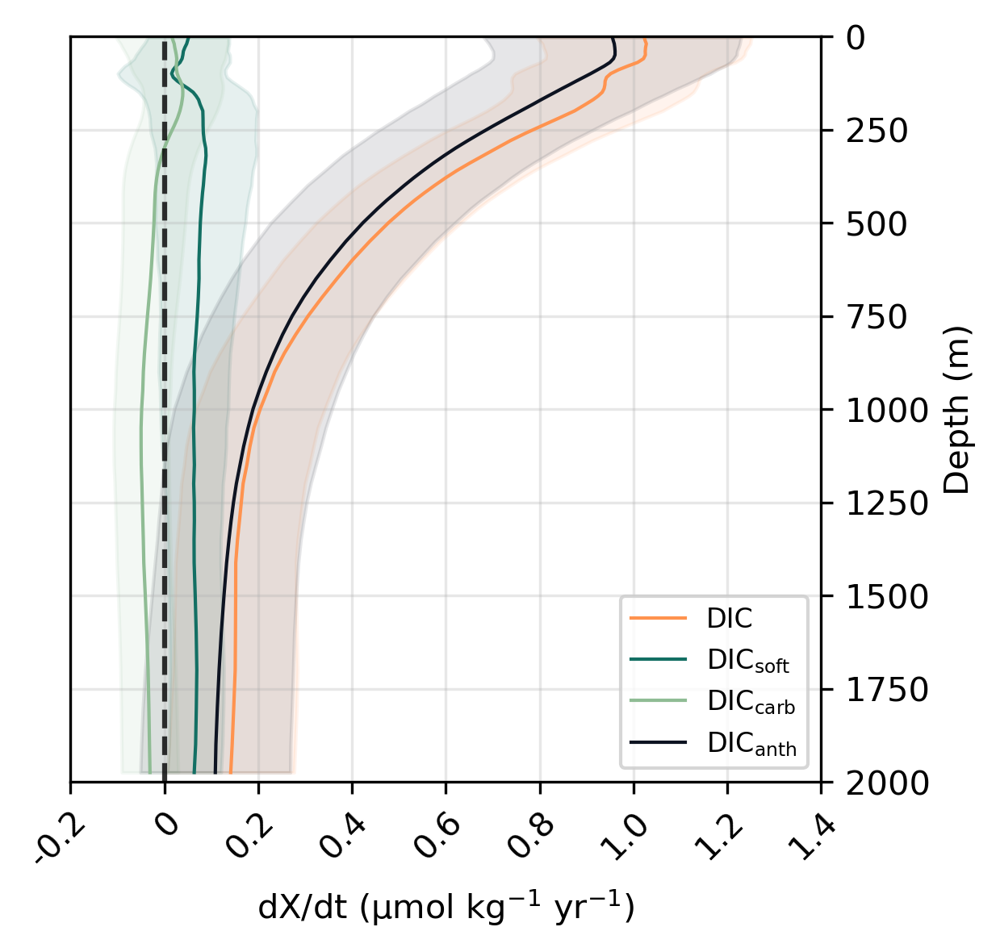

In [7]:
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
global_mean_ds = xr.load_dataset("data/01_DIC_globally_averaged_change_monte_carlo_online.nc")

# Create a single figure with just ax2
fig, ax2 = plt.subplots(figsize=(4, 4), dpi=300)  # Adjust figure size as needed

# Custom labels and colors
custom_labels = {
    'DIC_rate': 'DIC',
    'soft_pump_aou_change': 'DIC$_{\\mathrm{soft}}$',
    'carb_pump_change': 'DIC$_{\\mathrm{carb}}$',
    'co2_anth_aou_change': 'DIC$_{\\mathrm{anth}}$'
}
custom_colors = {
    'DIC_rate': '#FF934F',
    'soft_pump_aou_change': '#136F63',
    'carb_pump_change': '#8FBC94',
    'co2_anth_aou_change': '#0D1321'
}

legend_handles = []  # To store handles for the legend

# Loop through the data variables to plot each one with custom colors and error bands
for var in ['DIC_rate', 'soft_pump_aou_change', 'carb_pump_change', 'co2_anth_aou_change']:
    data_array = global_mean_ds[var]
    sigma_var = global_mean_ds[f'{var}_uncertainty']  # Constructing the uncertainty variable name

    line, = ax2.plot(data_array, global_mean_ds['pres'], label=custom_labels[var], color=custom_colors[var], linewidth=1)
    ax2.fill_betweenx(global_mean_ds['pres'], data_array - sigma_var, data_array + sigma_var, color=custom_colors[var], alpha=0.1)

    legend_handles.append(line)  # Only add line (not fill_betweenx) to legend

# Set y-axis limits
ax2.set_ylim(2000, 0)  # Keeping pressure in reverse order (oceanographic convention)

# Set x-axis limits and labels
ax2.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4])
ax2.set_xticklabels(['-0.2', '0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4'])

# Rotate x-axis tick labels by 45 degrees
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Set up legend
ax2.legend(legend_handles, [custom_labels[var] for var in custom_labels], loc='lower right', fontsize=8)

# Improve figure
ax2.set_xlabel("dX/dt (μmol kg$^\mathrm{-1}$ yr$^\mathrm{-1})$")
ax2.set_ylabel('Depth (m)')
ax2.grid(alpha=0.3)

# Add subplot label "b)" to the top left
# ax2.text(0.05, 1.07, 'b)', transform=ax2.transAxes, va='top', ha='right')

# Add right y-axis ticks
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

# Add vertical line at x = 0
ax2.axvline(0, color='black', alpha=0.8, linestyle='--')

# Save and show the figure
plt.savefig('figs/Figure1.png', bbox_inches='tight', dpi=300)
plt.show()


### Interactive plot

In [8]:
import plotly.graph_objects as go
import xarray as xr

# Load dataset
global_mean_ds = xr.load_dataset("data/01_DIC_globally_averaged_change_monte_carlo_online.nc")

# Custom labels and colors
custom_labels = {
    'DIC_rate': 'DIC',
    'soft_pump_aou_change': 'DIC$_{\mathrm{soft}}$',
    'carb_pump_change': 'DIC$_{\mathrm{carb}}$',
    'co2_anth_aou_change': 'DIC$_{\mathrm{anth}}$'
}
custom_colors = {
    'DIC_rate': '#FF934F',
    'soft_pump_aou_change': '#136F63',
    'carb_pump_change': '#8FBC94',
    'co2_anth_aou_change': '#0D1321'
}

# Create figure
fig = go.Figure()

# Loop through the data variables to plot each one with custom colors and error bands
for var in ['DIC_rate', 'soft_pump_aou_change', 'carb_pump_change', 'co2_anth_aou_change']:
    data_array = global_mean_ds[var].values
    sigma_var = global_mean_ds[f'{var}_uncertainty'].values  # Constructing the uncertainty variable name
    pres = global_mean_ds['pres'].values
    
    # Add line plot
    fig.add_trace(go.Scatter(
        x=data_array, y=pres, mode='lines',
        line=dict(color=custom_colors[var]),
        name=custom_labels[var]
    ))
    
    # Add error fill
    fig.add_trace(go.Scatter(
        x=data_array - sigma_var, y=pres,
        fill=None, line=dict(color=custom_colors[var], width=0), showlegend=False
    ))
    fig.add_trace(go.Scatter(
        x=data_array + sigma_var, y=pres,
        fill='tonextx', 
        fillcolor=f"rgba({int(custom_colors[var][1:3], 16)}, {int(custom_colors[var][3:5], 16)}, {int(custom_colors[var][5:7], 16)}, 0.2)",
        line=dict(color=custom_colors[var], width=0), 
        showlegend=False
    ))

# Set y-axis limits (keeping pressure in reverse order)
fig.update_yaxes(autorange='reversed', title_text='Pressure (dbar)', side='right')

# Set x-axis limits and labels
fig.update_xaxes(title_text='dX/dt (μmol kg$^{-1}$ yr$^{-1})$',
                 tickvals=[-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4],
                 ticktext=['-0.2', '0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4'])

# Add vertical line at x = 0
fig.add_vline(x=0, line=dict(color='black', dash='dash', width=1))

# Improve figure
fig.update_layout(
    width=600, height=600,
    legend=dict(x=0.8, y=0.2, font=dict(size=10)),
    margin=dict(l=50, r=50, t=50, b=50),
    template='plotly_white'
)

# Show figure
fig.show()

### Statistics

In [9]:
import numpy as np
import xarray as xr

# Load dataset
global_mean_ds = xr.load_dataset("data/01_DIC_globally_averaged_change_monte_carlo_online.nc")

def round_to_uncertainty(value, uncertainty):
    """Rounds a value to match the significant figures of its uncertainty."""
    if uncertainty == 0:  # Avoid log10 issues if uncertainty is zero
        return value, uncertainty

    sci_notation = f"{uncertainty:.1e}"  # Example: "2.3e-01"
    first_sig_fig = int(sci_notation[0])  # Extract first digit only

    num_sig_figs = 2 if first_sig_fig in [1, 2] else 1

    rounded_uncertainty = round(uncertainty, -int(np.floor(np.log10(uncertainty))) + (num_sig_figs - 1))

    decimal_places = -int(np.floor(np.log10(rounded_uncertainty)))
    rounded_value = round(value, decimal_places)

    return rounded_value, rounded_uncertainty

# Extract max and min values with their uncertainties
max_dic_value = float(global_mean_ds.DIC_rate.max().values)
min_dic_value = float(global_mean_ds.DIC_rate.min().values)
max_dic_uncertainty = float(global_mean_ds.DIC_rate_uncertainty.max().values)
min_dic_uncertainty = float(global_mean_ds.DIC_rate_uncertainty.min().values)

max_co2_anth_value = float(global_mean_ds.co2_anth_aou_change.max().values)
min_co2_anth_value = float(global_mean_ds.co2_anth_aou_change.min().values)
max_co2_anth_uncertainty = float(global_mean_ds.co2_anth_aou_change_uncertainty.max().values)
min_co2_anth_uncertainty = float(global_mean_ds.co2_anth_aou_change_uncertainty.min().values)

# Compute mean values in the first 50m
surface_filter = global_mean_ds.pres <= 50

dic_mean_50m = float(global_mean_ds.DIC_rate.where(surface_filter, drop=True).mean().values)
dic_mean_50m_uncertainty = float(global_mean_ds.DIC_rate_uncertainty.where(surface_filter, drop=True).mean().values)

co2_anth_mean_50m = float(global_mean_ds.co2_anth_aou_change.where(surface_filter, drop=True).mean().values)
co2_anth_mean_50m_uncertainty = float(global_mean_ds.co2_anth_aou_change_uncertainty.where(surface_filter, drop=True).mean().values)

soft_pump_mean_50m = float(global_mean_ds.soft_pump_aou_change.where(surface_filter, drop=True).mean().values)
soft_pump_uncertainty_50m = float(global_mean_ds.soft_pump_aou_change_uncertainty.where(surface_filter, drop=True).mean().values)

# Compute min of `soft_pump_aou_change`
soft_pump_min = float(global_mean_ds.soft_pump_aou_change.min().values)
soft_pump_min_uncertainty = float(global_mean_ds.soft_pump_aou_change_uncertainty.min().values)

# Compute max of `carb_pump_change` and its associated uncertainty
carb_pump_max = float(global_mean_ds.carb_pump_change.max().values)
carb_pump_max_uncertainty = float(global_mean_ds.carb_pump_change_uncertainty.max().values)

# Compute mean `carb_pump_change` below 250m with uncertainty
deep_filter = global_mean_ds.pres > 250
carb_pump_mean_below_250 = float(global_mean_ds.carb_pump_change.where(deep_filter, drop=True).mean().values)
carb_pump_mean_below_250_uncertainty = float(global_mean_ds.carb_pump_change_uncertainty.where(deep_filter, drop=True).mean().values)

# Apply rounding function
dic_max_rounded, dic_max_uncertainty_rounded = round_to_uncertainty(max_dic_value, max_dic_uncertainty)
dic_min_rounded, dic_min_uncertainty_rounded = round_to_uncertainty(min_dic_value, min_dic_uncertainty)

co2_anth_max_rounded, co2_anth_max_uncertainty_rounded = round_to_uncertainty(max_co2_anth_value, max_co2_anth_uncertainty)
co2_anth_min_rounded, co2_anth_min_uncertainty_rounded = round_to_uncertainty(min_co2_anth_value, min_co2_anth_uncertainty)

dic_mean_50m_rounded, dic_mean_50m_uncertainty_rounded = round_to_uncertainty(dic_mean_50m, dic_mean_50m_uncertainty)
co2_anth_mean_50m_rounded, co2_anth_mean_50m_uncertainty_rounded = round_to_uncertainty(co2_anth_mean_50m, co2_anth_mean_50m_uncertainty)
soft_pump_mean_50m_rounded, soft_pump_uncertainty_50m_rounded = round_to_uncertainty(soft_pump_mean_50m, soft_pump_uncertainty_50m)

soft_pump_min_rounded, soft_pump_min_uncertainty_rounded = round_to_uncertainty(soft_pump_min, soft_pump_min_uncertainty)

carb_pump_max_rounded, carb_pump_max_uncertainty_rounded = round_to_uncertainty(carb_pump_max, carb_pump_max_uncertainty)
carb_pump_mean_below_250_rounded, carb_pump_mean_below_250_uncertainty_rounded = round_to_uncertainty(carb_pump_mean_below_250, carb_pump_mean_below_250_uncertainty)

# Print results with correct significant figures
print(f"Max change in DIC in surface waters: {dic_max_rounded} ± {dic_max_uncertainty_rounded}")
print(f"Min change in DIC in surface waters: {dic_min_rounded} ± {dic_min_uncertainty_rounded}")
print(f"Mean change in DIC in first 50m: {dic_mean_50m_rounded} ± {dic_mean_50m_uncertainty_rounded}")

print(f"Max change in anthropogenic CO₂ AOU: {co2_anth_max_rounded} ± {co2_anth_max_uncertainty_rounded}")
print(f"Min change in anthropogenic CO₂ AOU: {co2_anth_min_rounded} ± {co2_anth_min_uncertainty_rounded}")
print(f"Mean change in anthropogenic CO₂ AOU in first 50m: {co2_anth_mean_50m_rounded} ± {co2_anth_mean_50m_uncertainty_rounded}")

print(f"Mean soft pump AOU change in first 50m: {soft_pump_mean_50m_rounded} ± {soft_pump_uncertainty_50m_rounded}")
print(f"Min soft pump AOU change: {soft_pump_min_rounded} ± {soft_pump_min_uncertainty_rounded}")

print(f"Max carbonate pump change: {carb_pump_max_rounded} ± {carb_pump_max_uncertainty_rounded}")
print(f"Mean carbonate pump change below 250m: {carb_pump_mean_below_250_rounded} ± {carb_pump_mean_below_250_uncertainty_rounded}")


Max change in DIC in surface waters: 1.0 ± 0.23
Min change in DIC in surface waters: 0.1 ± 0.13
Mean change in DIC in first 50m: 1.0 ± 0.22
Max change in anthropogenic CO₂ AOU: 1.0 ± 0.27
Min change in anthropogenic CO₂ AOU: 0.1 ± 0.15
Mean change in anthropogenic CO₂ AOU in first 50m: 1.0 ± 0.27
Mean soft pump AOU change in first 50m: 0.05 ± 0.09
Min soft pump AOU change: 0.02 ± 0.06
Max carbonate pump change: 0.0 ± 0.12
Mean carbonate pump change below 250m: -0.03 ± 0.06


**____________________________________________________________________________________________________________________________**


## Figure 2
### Spatial redistribution of the BCP through depth-integrated (i.e., 0 to 2000m) rates of change in DICsoft across the study period

#### 02_DIC_integrated_change_map_monte_carlo_online_pres_diff

This script performs a **Monte Carlo-based uncertainty analysis** on the **depth-integrated carbon change driven by the soft tissue pump** in the global ocean. The workflow includes:

**1. Data Loading & Preprocessing**
- Loads a global ocean dataset containing **apparent oxygen utilization (AOU)**, **temperature**, **salinity**, and **pressure**.
- Computes **absolute salinity** and **potential temperature** using the **GSW (Gibbs Seawater) library**.
- Uses AOU to estimate the soft tissue pump’s impact on carbon cycling.

**2. Monte Carlo Simulations**
- Runs **1,000 iterations**, perturbing **AOU** based on its uncertainty.
- For each iteration:
  - Computes **linear trends** (per year) for AOU using **polynomial fitting**.
  - Perturbs key parameters associated with the **soft tissue pump** using their uncertainties.

**3. Soft Tissue Pump Contribution to Carbon Cycling**
- Uses **AOU trends** to estimate the **soft tissue pump-driven carbon change**.
- Applies a **stoichiometric ratio** to convert AOU trends into carbon fluxes.
- Computes the **depth-integrated impact of the soft tissue pump on carbon storage**.

**4. Depth Integration of Soft Tissue Pump-Driven Changes**
- Integrates the **soft tissue pump’s contribution over pressure levels** to quantify **depth-integrated carbon changes**.

**5. Uncertainty Quantification & Error Propagation**
- Uses **Welford’s method** to iteratively compute the **mean and variance** of Monte Carlo results.
- Propagates uncertainties across **depth layers**.

**6. Results Export**
- Converts values from **mmol/m²/yr to mol/m²/yr**.
- Saves the final dataset with **depth-integrated soft tissue pump-driven carbon change and uncertainty estimates** for further analysis.


C:\Users\ldelaigue\AppData\Local\Temp\ipykernel_15076\540789215.py:30: RuntimeWarning:

invalid value encountered in divide



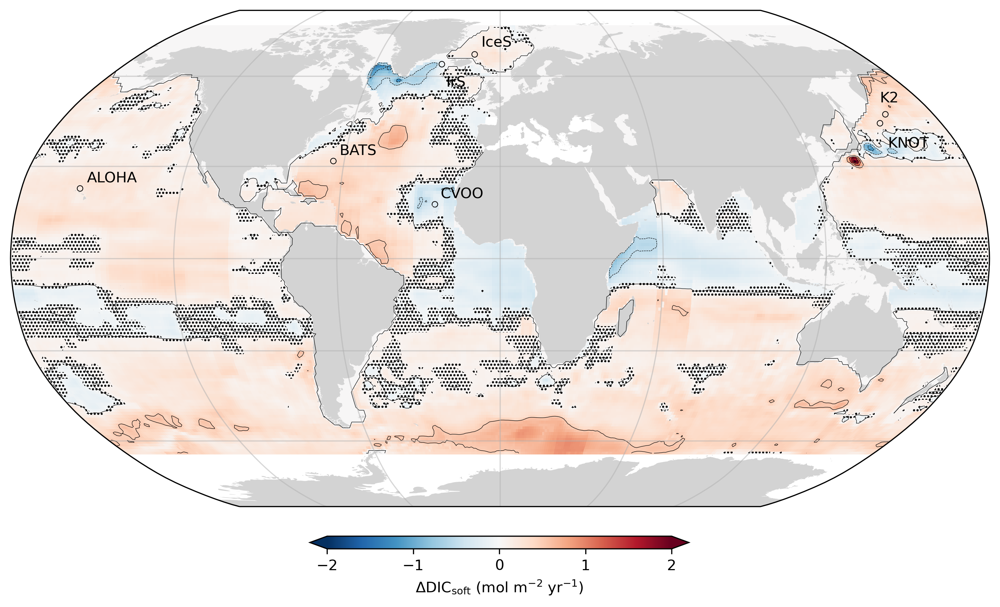

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import xarray as xr

# --- Define Mediterranean mask function ---
def mask_mediterranean(lat, lon):
    """
    Returns a boolean mask that is True over the Mediterranean Sea.
    """
    lat_min, lat_max = 30, 46
    lon_min, lon_max = -6, 37
    return (lat >= lat_min) & (lat <= lat_max) & (lon >= lon_min) & (lon <= lon_max)

# --- Load dataset ---
dic_nat_total_change = xr.load_dataset("data/02_DIC_integrated_change_map_monte_carlo_online_pres_diff.nc")

# --- Extract coordinates ---
lon = dic_nat_total_change.coords['lon'].values
lat = dic_nat_total_change.coords['lat'].values
lon_2d, lat_2d = np.meshgrid(lon, lat)

# --- Extract data and uncertainty ---
dic_nat_total_change_data = dic_nat_total_change['soft_pump_aou_change'].values
uncertainty_data = dic_nat_total_change['soft_pump_aou_change_uncertainty'].values

# --- Compute relative uncertainty ---
relative_uncertainty = (uncertainty_data / np.abs(dic_nat_total_change_data)) * 100
relative_uncertainty[np.isnan(relative_uncertainty)] = 0

# --- Define high uncertainty threshold (90th percentile) ---
threshold = np.percentile(relative_uncertainty, 90)
high_uncertainty_mask = relative_uncertainty > threshold

# --- Mask Mediterranean Sea ---
med_mask = mask_mediterranean(lat_2d, lon_2d)
dic_nat_total_change_data = np.where(med_mask, np.nan, dic_nat_total_change_data)
high_uncertainty_mask = np.where(med_mask, False, high_uncertainty_mask)

# --- Create figure ---
fig = plt.figure(figsize=(12, 8), dpi=300)
ax1 = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax1.set_global()

# Add land
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax1.add_feature(land_feature)

# Gridlines
ax1.gridlines(draw_labels=False, alpha=0.5)

# Plot ΔDICnat
norm1 = TwoSlopeNorm(vcenter=0, vmin=-2, vmax=2)
im1 = ax1.pcolormesh(lon_2d, lat_2d, dic_nat_total_change_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm1)

# Add hatching for high uncertainty
ax1.contourf(lon_2d, lat_2d, high_uncertainty_mask, levels=[0.5, 1], colors='xkcd:grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())

# Add contour lines
levels = np.arange(-2, 2.5, 0.5)
ax1.contour(lon_2d, lat_2d, dic_nat_total_change_data, levels=levels, colors='black', linewidths=0.3, transform=ccrs.PlateCarree())

# Title and colorbar
ax1.set_title("")
cbar_ax1 = fig.add_axes([0.362, 0.15, 0.3, 0.015])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal', extend='both')
cbar1.set_label(r'$\Delta$DIC$_{\mathrm{soft}}$ (mol m$^{-2}$ yr$^{-1}$)')

# --- Add time series locations ---
time_series_locations = [
    (-158.002237, 22.752951, 'ALOHA', 2, 2),
    (-64.189528, 31.665369, 'BATS', 2, 2),
    (-24.278775, 17.594396, 'CVOO', 2, 2),
    (-12.670897, 67.996233, 'IceS', 3, 3),
    (-27.955002, 64.335978, 'IrS', 4, -8),
    (160.050667, 46.968458, 'K2', 2, 4),
    (154.998005, 44.003165, 'KNOT', -3, -8)
]

for x, y, label, x_offset, y_offset in time_series_locations:
    ax1.text(x + x_offset, y + y_offset, label, transform=ccrs.Geodetic(), fontsize=10)
    ax1.scatter(x, y, edgecolor='black', facecolor='none', linewidths=0.5, transform=ccrs.PlateCarree(), s=15)

# --- Save figure ---
fig.savefig('figs/Figure2a_with_uncertainty.png', bbox_inches='tight', dpi=300)
plt.show()


### Statistics with interactive map

In [11]:
import plotly.graph_objects as go
import xarray as xr
import numpy as np

# Load dataset
ds = xr.open_dataset('data/02_DIC_integrated_change_map_monte_carlo_online_pres_diff.nc')
var_name = 'soft_pump_aou_change'
uncertainty_var_name = 'soft_pump_aou_change_uncertainty'

lat = ds['lat'].values
lon = ds['lon'].values

data = ds[var_name].values
uncertainty = ds[uncertainty_var_name].values

# Define latitude and longitude ranges 
lat_range = slice(-5, 10)  
lon_range = slice(39.5, 103.5)

# Subset the dataset for the given lat and lon range
subset = ds[var_name].sel(lat=lat_range, lon=lon_range)
uncertainty_subset = ds[uncertainty_var_name].sel(lat=lat_range, lon=lon_range)

# Calculate mean, min, and max values along with uncertainties
mean_value = subset.mean().values
mean_uncertainty = np.sqrt((uncertainty_subset ** 2).mean()).values  # Propagate uncertainty

min_value = subset.min().values
max_value = subset.max().values

# Extract uncertainty corresponding to min and max values
min_uncertainty = uncertainty_subset.where(subset == min_value, drop=True).min().values
max_uncertainty = uncertainty_subset.where(subset == max_value, drop=True).max().values

# Function to format values with 2 decimal places
def format_value(value, uncertainty):
    formatted_value = f"{value:.2f}"
    formatted_uncertainty = f"{uncertainty:.2f}"
    return f"{formatted_value} ± {formatted_uncertainty}"

# Print results
print("Statistics within selected area:")
print(f"Mean value: {format_value(mean_value, mean_uncertainty)}")
print(f"Min value: {format_value(min_value, min_uncertainty)}")
print(f"Max value: {format_value(max_value, max_uncertainty)}")

# Create a Plotly figure with a diverging color scale
fig = go.Figure(go.Heatmap(
    z=data,
    x=lon,
    y=lat,
    colorscale='RdBu_r',  # Red for positive, blue for negative
    zmid=0  # Set the midpoint at 0 for normalization
))

# Add a rectangle (square) for the selected lat and lon range
fig.add_trace(go.Scatter(
    x=[lon_range.start, lon_range.stop, lon_range.stop, lon_range.start, lon_range.start],
    y=[lat_range.start, lat_range.start, lat_range.stop, lat_range.stop, lat_range.start],
    mode="lines",
    line=dict(color="black", width=2),
    name="Selected Area"
))

# Update layout
fig.update_layout(
    title="DICnat total change (mol/m2/yr)",
    xaxis_title="Longitude",
    yaxis_title="Latitude"
)

# Show the plot
fig.show()

Statistics within selected area:
Mean value: -0.20 ± 0.04
Min value: -0.85 ± 0.13
Max value: 0.00 ± 0.00


**____________________________________________________________________________________________________________________________**


## Figure 3a
### Net new DICsoft sequestered below the maximum climatological MLD across the study period

This script performs a **Monte Carlo-based uncertainty analysis** on the **depth-integrated dissolved inorganic carbon (DIC) sequestration below the winter mixed layer depth (MLD)** in the global ocean. The workflow includes:

**1. Data Loading & Preprocessing**
- Loads a global ocean dataset containing **salinity, temperature, oxygen, and pressure**.
- Computes **absolute salinity** and **potential temperature** using the **GSW (Gibbs Seawater) library**.
- Uses **oxygen and temperature data** to estimate **apparent oxygen utilization (AOU)**, a key metric for biological carbon cycling.
- Computes **seawater density** using the **GSW density module**.
- Uses a **stoichiometric ratio** to calculate **DIC from AOU**, representing the contribution of the soft tissue pump.

**2. Mixed Layer Depth (MLD) Data Processing**
- Loads **mixed layer depth (MLD) data** from an external dataset.
- Adjusts **longitude coordinates** to ensure consistency between datasets.
- Interpolates MLD data onto the **same lat/lon grid** as the main dataset.
- Applies an **MLD-based mask**, filtering out data above the mixed layer to focus on **sub-MLD carbon sequestration**.


**3. Monte Carlo Simulations**
- Runs **1,000 iterations**, perturbing **AOU** and **stoichiometric constants** based on their uncertainties.
- For each iteration:
  - Perturbs **AOU** values using **normally distributed noise**.
  - Perturbs the **stoichiometric conversion factor** used for DIC estimation.
  - Computes **DIC changes below the mixed layer** by integrating over depth.
  - Converts values into **mol/m³ and mol/m²**, ensuring proper unit consistency.

**4. Depth-Integrated DIC Sequestration Calculation**
- Computes **pressure layer thickness** and integrates **DIC sequestration per unit area**.
- Accumulates **depth-integrated DIC sequestration** across the full profile.
- Computes **monthly changes** in sequestration over time.

**5. Uncertainty Quantification & Error Propagation**
- Uses **Welford’s method** to iteratively compute the **mean and variance** of Monte Carlo results.
- Propagates uncertainties across **spatial and temporal dimensions**.
- Computes **final standard deviations** after all Monte Carlo iterations are completed.

**6. Final Dataset & Results Export**
- Outputs a dataset containing:
  - **Mean depth-integrated DIC sequestration below the winter MLD**.
  - **Uncertainty (standard deviation) of the sequestration estimates**.
- Saves the final dataset in **NetCDF format** for further analysis.


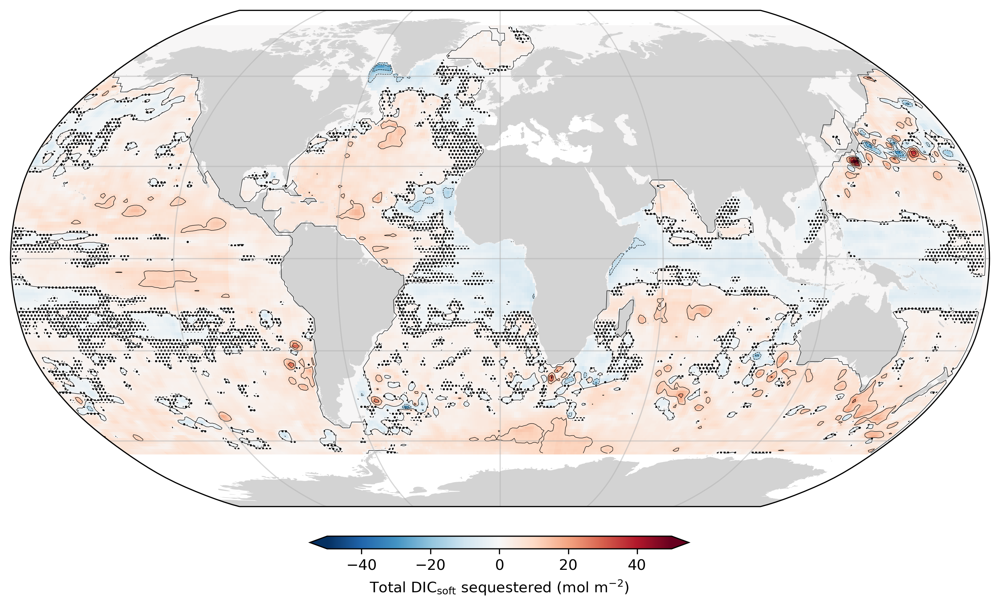

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import xarray as xr

# --- Define Mediterranean mask function ---
def mask_mediterranean(lat, lon):
    """
    Returns a boolean mask that is True over the Mediterranean Sea.
    """
    lat_min, lat_max = 30, 46
    lon_min, lon_max = -6, 37
    return (lat >= lat_min) & (lat <= lat_max) & (lon >= lon_min) & (lon <= lon_max)

# --- Load dataset ---
dic_nat_new_seq = xr.load_dataset("data/03_DIC_sequestration_below_winter_MLD_monte_carlo_online_1000_iterations.nc")

# --- Extract coordinates ---
lon = dic_nat_new_seq.coords['lon'].values
lat = dic_nat_new_seq.coords['lat'].values
lon_2d, lat_2d = np.meshgrid(lon, lat)

# --- Extract data and uncertainty ---
dic_nat_new_seq_data = dic_nat_new_seq['DIC_nat_sequestration'].values
uncertainty_data = dic_nat_new_seq['DIC_nat_sequestration_uncertainty'].values

# --- Compute relative uncertainty (%)
eps = np.finfo(float).eps
relative_uncertainty = (uncertainty_data / (np.abs(dic_nat_new_seq_data) + eps)) * 100
relative_uncertainty[np.isnan(relative_uncertainty)] = 0

# --- Define high uncertainty threshold (90th percentile) ---
threshold = np.percentile(relative_uncertainty, 90)
high_uncertainty_mask = relative_uncertainty > threshold

# --- Apply Mediterranean Sea mask ---
med_mask = mask_mediterranean(lat_2d, lon_2d)
dic_nat_new_seq_data = np.where(med_mask, np.nan, dic_nat_new_seq_data)
high_uncertainty_mask = np.where(med_mask, False, high_uncertainty_mask)

# --- Create figure ---
fig = plt.figure(figsize=(12, 8), dpi=300)
ax1 = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax1.set_global()

# Add land feature
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax1.add_feature(land_feature)

# Gridlines
ax1.gridlines(draw_labels=False, alpha=0.5)

# Plot ΔDICnat data
norm1 = TwoSlopeNorm(vcenter=0, vmin=-50, vmax=50)
im1 = ax1.pcolormesh(lon, lat, dic_nat_new_seq_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm1)

# Add high uncertainty hatching
ax1.contourf(lon_2d, lat_2d, high_uncertainty_mask, levels=[0.5, 1], colors='xkcd:grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())

# Contour lines
levels = np.arange(-50, 55, 10)
ax1.contour(lon_2d, lat_2d, dic_nat_new_seq_data, levels=levels, colors='black', linewidths=0.3, transform=ccrs.PlateCarree())

# Title
ax1.set_title("")

# Colorbar
cbar_ax1 = fig.add_axes([0.362, 0.15, 0.3, 0.015])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal', extend='both')
cbar1.set_label(r'Total DIC$_{\mathrm{soft}}$ sequestered (mol m$^{-2}$)')

# Save figure
# fig.savefig('figs/Figure2b_with_uncertainty.png', bbox_inches='tight', dpi=300)
plt.show()


### Statistics with interactive plot

In [22]:
import plotly.graph_objects as go
import xarray as xr
import numpy as np

# Load dataset
ds = xr.open_dataset('data/03_DIC_sequestration_below_winter_MLD_monte_carlo_online_1000_iterations.nc')
var_name = 'DIC_nat_sequestration'
uncertainty_var_name = 'DIC_nat_sequestration_uncertainty'

lat = ds['lat'].values
lon = ds['lon'].values

data = ds[var_name].values
uncertainty = ds[uncertainty_var_name].values

# Define latitude and longitude ranges 
lat_range = slice(46.5, 61.5)  
lon_range = slice(-32.5, -20.5)

# Subset the dataset for the given lat and lon range
subset = ds[var_name].sel(lat=lat_range, lon=lon_range)
uncertainty_subset = ds[uncertainty_var_name].sel(lat=lat_range, lon=lon_range)

# Calculate mean, min, and max values along with uncertainties
mean_value = subset.mean().values
mean_uncertainty = np.sqrt((uncertainty_subset ** 2).mean()).values  # Propagate uncertainty

min_value = subset.min().values
max_value = subset.max().values

# Extract uncertainty corresponding to min and max values
min_uncertainty = uncertainty_subset.where(subset == min_value, drop=True).min().values
max_uncertainty = uncertainty_subset.where(subset == max_value, drop=True).max().values

# Function to format values with 2 decimal places
def format_value(value, uncertainty):
    formatted_value = f"{value:.2f}"
    formatted_uncertainty = f"{uncertainty:.2f}"
    return f"{formatted_value} ± {formatted_uncertainty}"

# Print results
print("Statistics within selected area:")
print(f"Mean value: {format_value(mean_value, mean_uncertainty)}")
print(f"Min value: {format_value(min_value, min_uncertainty)}")
print(f"Max value: {format_value(max_value, max_uncertainty)}")

# Create a Plotly figure with a diverging color scale
fig = go.Figure(go.Heatmap(
    z=data,
    x=lon,
    y=lat,
    colorscale='RdBu_r',  # Red for positive, blue for negative
    zmid=0  # Set the midpoint at 0 for normalization
))

# Add a rectangle (square) for the selected lat and lon range
fig.add_trace(go.Scatter(
    x=[lon_range.start, lon_range.stop, lon_range.stop, lon_range.start, lon_range.start],
    y=[lat_range.start, lat_range.start, lat_range.stop, lat_range.stop, lat_range.start],
    mode="lines",
    line=dict(color="black", width=2),
    name="Selected Area"
))

# Update layout
fig.update_layout(
    title="DICnat total change (mol/m2/yr)",
    xaxis_title="Longitude",
    yaxis_title="Latitude"
)

# Show the plot
fig.show()

Statistics within selected area:
Mean value: -0.50 ± 2.85
Min value: -6.43 ± 3.00
Max value: 8.60 ± 2.98


**____________________________________________________________________________________________________________________________**


## Figure 3b
### Change in 50% sequestration depth over time

This script performs a **Monte Carlo-based uncertainty analysis** on the **depth at which 50% of the biologically sequestered DIC lies below the winter mixed layer depth (MLD)**, followed by a **trend estimation** of this depth over time. The workflow includes:

**1. Data Loading & Preprocessing**
- Loads a global ocean dataset containing **salinity, temperature, oxygen, and pressure**.
- Computes **absolute salinity** and **potential temperature** using the **GSW (Gibbs Seawater) library**.
- Estimates **apparent oxygen utilization (AOU)** using **GG92 parameterization** from the **koolstof** package.
- Computes **seawater density** using GSW.
- Retains only the **AOU**, its **uncertainty**, and **density** variables for further processing.

**2. Mixed Layer Depth (MLD) Data Processing**
- Loads **mixed layer depth (MLD) data** from an external dataset.
- Adjusts **longitude coordinates** to match the main dataset's format.
- Interpolates **maximum winter MLD** onto the main dataset’s lat/lon grid.
- Applies a **depth-based mask**, retaining only data **below the interpolated MLD**, focusing on sub-MLD sequestration.

**3. Monte Carlo Simulations**
- Performs **multiple iterations** (configurable) to account for uncertainty in AOU and stoichiometric conversion.
- For each iteration:
  - Perturbs AOU using **normally distributed noise** based on measurement uncertainty.
  - Samples a perturbed **stoichiometric ratio** for DIC conversion.
  - Converts **AOU to DIC** and computes **DIC concentration (mol/m³)** and **depth-layer DIC (mol/m²)**.
  - Computes the **depth-integrated DIC below the MLD** and determines the **50% sequestration depth** by cumulative sum.

**4. Uncertainty Quantification**
- Uses **Welford’s online algorithm** to iteratively compute the **mean and variance** of the 50% depth across Monte Carlo iterations.
- Calculates the **standard deviation** as the final uncertainty estimate.
- Saves the resulting **mean 50% DIC sequestration depth** and its **associated uncertainty** to a NetCDF file.

**5. Temporal Trend Estimation**
- Loads the time series of the **50% DIC sequestration depth** and its uncertainty.
- Applies **LOESS smoothing** to reduce short-term noise in the time series.
- For each lat/lon grid point:
  - Fits a **linear regression** to the smoothed time series.
  - Computes the **slope (m/yr)** of the 50% depth over time.
  - Propagates both **regression error** and **observational uncertainty** to estimate **slope uncertainty**.
  - Stores additional statistics: **R², p-value**, and data subsets for interquartile comparison.
- Outputs a dataset containing:
  - **Trend (slope) in 50% DIC sequestration depth (m/yr)**.
  - **Uncertainty in the slope**, significance metrics, and inter-seasonal stats.
- Saves the summary results as a **NetCDF file** for visualization and further analysis.


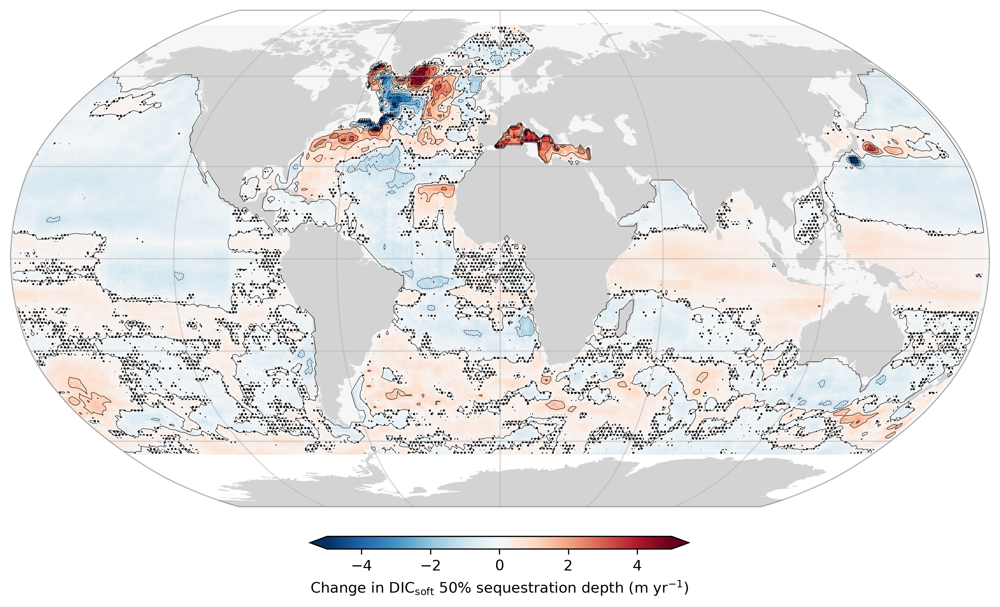

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import xarray as xr

# Load dataset
dic_nat_new_seq = xr.load_dataset("data/04bis_DIC_50depth_stats.nc")

# Extract coordinates
lon = dic_nat_new_seq.coords['lon'].values  # Shape (360,)
lat = dic_nat_new_seq.coords['lat'].values  # Shape (145,)
lon_2d, lat_2d = np.meshgrid(lon, lat)  # Shapes: (145, 360)

# Extract data and uncertainty
dic_nat_new_seq_data = dic_nat_new_seq['Slope_per_year'].values  # Shape (145, 360)
uncertainty_data = dic_nat_new_seq['Slope_uncertainty_per_year'].values  # Shape (145, 360)

# Compute relative uncertainty (%)
eps = np.finfo(float).eps  # Smallest positive float number to avoid division by zero
relative_uncertainty = (uncertainty_data / (np.abs(dic_nat_new_seq_data) + eps)) * 100
relative_uncertainty[np.isnan(relative_uncertainty)] = 0  # Handle NaNs

# Define high uncertainty threshold (90th percentile)
threshold = np.percentile(relative_uncertainty, 90)
high_uncertainty_mask = relative_uncertainty > threshold  # Boolean mask

# Normalization parameters
vmin = dic_nat_new_seq_data.min()
vmax = dic_nat_new_seq_data.max()

# Create figure
fig = plt.figure(figsize=(12, 8), dpi=300)
ax1 = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax1.set_global()

# Add land feature
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax1.add_feature(land_feature)

# Gridlines
gl1 = ax1.gridlines(draw_labels=False, alpha=0.5)

# Plot ΔDICnat data
norm1 = TwoSlopeNorm(vcenter=0, vmin=-5, vmax=5)
im1 = ax1.pcolormesh(lon, lat, dic_nat_new_seq_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm1)

# Add high uncertainty hatching
ax1.contourf(lon_2d, lat_2d, high_uncertainty_mask, levels=[0.5, 1], colors='xkcd:grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())

# Contour lines
levels = np.arange(-5, 5, 1)
contour1 = ax1.contour(lon_2d, lat_2d, dic_nat_new_seq_data, levels=levels, colors='black', linewidths=0.3, transform=ccrs.PlateCarree())

# Remove title
ax1.set_title("")

# Colorbar
cbar_ax1 = fig.add_axes([0.362, 0.15, 0.3, 0.015])  # Adjust position if needed
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal', extend='both')
cbar1.set_label(r'Change in DIC$_{\mathrm{soft}}$ 50% sequestration depth (m yr$^{-1}$)')

# Adjust the transparency of the frame around the second plot
for spine in ax1.spines.values():
    spine.set_alpha(0.3)

# Save figure
fig.savefig('figs/Figure3_with_uncertainty_1000_iterations.png', bbox_inches='tight', dpi=300)
plt.show()
    

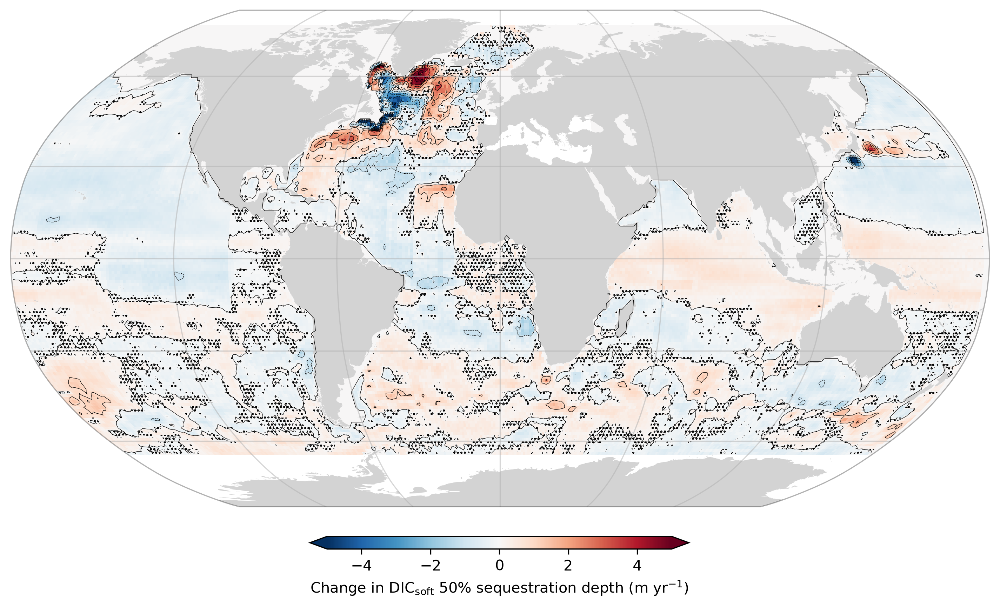

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import xarray as xr

# --- Define Mediterranean mask function ---
def mask_mediterranean(lat, lon):
    """
    Returns a boolean mask that is True over the Mediterranean Sea.
    """
    lat_min, lat_max = 30, 46
    lon_min, lon_max = -6, 37
    return (lat >= lat_min) & (lat <= lat_max) & (lon >= lon_min) & (lon <= lon_max)

# --- Load dataset ---
dic_nat_new_seq = xr.load_dataset("data/04bis_DIC_50depth_stats.nc")

# --- Extract coordinates ---
lon = dic_nat_new_seq.coords['lon'].values  # Shape (360,)
lat = dic_nat_new_seq.coords['lat'].values  # Shape (145,)
lon_2d, lat_2d = np.meshgrid(lon, lat)  # Shapes: (145, 360)

# --- Extract data and uncertainty ---
dic_nat_new_seq_data = dic_nat_new_seq['Slope_per_year'].values  # Shape (145, 360)
uncertainty_data = dic_nat_new_seq['Slope_uncertainty_per_year'].values  # Shape (145, 360)

# --- Compute relative uncertainty (%)
eps = np.finfo(float).eps
relative_uncertainty = (uncertainty_data / (np.abs(dic_nat_new_seq_data) + eps)) * 100
relative_uncertainty[np.isnan(relative_uncertainty)] = 0

# --- Define high uncertainty threshold (90th percentile) ---
threshold = np.percentile(relative_uncertainty, 90)
high_uncertainty_mask = relative_uncertainty > threshold

# --- Apply Mediterranean Sea mask ---
med_mask = mask_mediterranean(lat_2d, lon_2d)
dic_nat_new_seq_data = np.where(med_mask, np.nan, dic_nat_new_seq_data)
high_uncertainty_mask = np.where(med_mask, False, high_uncertainty_mask)

# --- Create figure ---
fig = plt.figure(figsize=(12, 8), dpi=300)
ax1 = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax1.set_global()

# Add land feature
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax1.add_feature(land_feature)

# Gridlines
ax1.gridlines(draw_labels=False, alpha=0.5)

# Plot ΔDICnat data
norm1 = TwoSlopeNorm(vcenter=0, vmin=-5, vmax=5)
im1 = ax1.pcolormesh(lon, lat, dic_nat_new_seq_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm1)

# Add high uncertainty hatching
ax1.contourf(lon_2d, lat_2d, high_uncertainty_mask, levels=[0.5, 1], colors='xkcd:grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())

# Contour lines
levels = np.arange(-5, 6, 1)
ax1.contour(lon_2d, lat_2d, dic_nat_new_seq_data, levels=levels, colors='black', linewidths=0.3, transform=ccrs.PlateCarree())

# Title
ax1.set_title("")

# Colorbar
cbar_ax1 = fig.add_axes([0.362, 0.15, 0.3, 0.015])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal', extend='both')
cbar1.set_label(r'Change in DIC$_{\mathrm{soft}}$ 50% sequestration depth (m yr$^{-1}$)')

# Fade frame
for spine in ax1.spines.values():
    spine.set_alpha(0.3)

# Save figure
# fig.savefig('figs/Figure3_with_uncertainty_1000_iterations.png', bbox_inches='tight', dpi=300)
plt.show()


In [40]:
import plotly.graph_objects as go
import xarray as xr
import numpy as np

# Load dataset
ds = xr.open_dataset('data/04bis_DIC_50depth_stats.nc')
var_name = 'Slope_per_year'
uncertainty_var_name = 'Slope_uncertainty_per_year'

lat = ds['lat'].values
lon = ds['lon'].values

data = ds[var_name].values
uncertainty = ds[uncertainty_var_name].values

# Define latitude and longitude ranges 
lat_range = slice(-70, -50)  
lon_range = slice(-180, 180)

# Subset the dataset for the given lat and lon range
subset = ds[var_name].sel(lat=lat_range, lon=lon_range)
uncertainty_subset = ds[uncertainty_var_name].sel(lat=lat_range, lon=lon_range)

# Calculate mean, min, and max values along with uncertainties
mean_value = subset.mean().values
mean_uncertainty = np.sqrt((uncertainty_subset ** 2).mean()).values  # Propagate uncertainty

min_value = subset.min().values
max_value = subset.max().values

# Extract uncertainty corresponding to min and max values
min_uncertainty = uncertainty_subset.where(subset == min_value, drop=True).min().values
max_uncertainty = uncertainty_subset.where(subset == max_value, drop=True).max().values

# Function to format values with 2 decimal places
def format_value(value, uncertainty):
    formatted_value = f"{value:.2f}"
    formatted_uncertainty = f"{uncertainty:.2f}"
    return f"{formatted_value} ± {formatted_uncertainty}"

# Print results
print("Statistics within selected area:")
print(f"Mean value: {format_value(mean_value, mean_uncertainty)}")
print(f"Min value: {format_value(min_value, min_uncertainty)}")
print(f"Max value: {format_value(max_value, max_uncertainty)}")

# Create a Plotly figure with a diverging color scale
fig = go.Figure(go.Heatmap(
    z=data,
    x=lon,
    y=lat,
    colorscale='RdBu_r',  # Red for positive, blue for negative
    zmid=0  # Set the midpoint at 0 for normalization
))

# Add a rectangle (square) for the selected lat and lon range
fig.add_trace(go.Scatter(
    x=[lon_range.start, lon_range.stop, lon_range.stop, lon_range.start, lon_range.start],
    y=[lat_range.start, lat_range.start, lat_range.stop, lat_range.stop, lat_range.start],
    mode="lines",
    line=dict(color="black", width=2),
    name="Selected Area"
))

# Update layout
fig.update_layout(
    title="DICnat total change (m/yr)",
    xaxis_title="Longitude",
    yaxis_title="Latitude"
)

# Show the plot
fig.show()

Statistics within selected area:
Mean value: 0.06 ± 0.70
Min value: -1.21 ± 0.69
Max value: 2.22 ± 0.63


## Figure 3 - full

C:\Users\ldelaigue\AppData\Local\Temp\ipykernel_15076\1566916736.py:31: RuntimeWarning:

invalid value encountered in divide



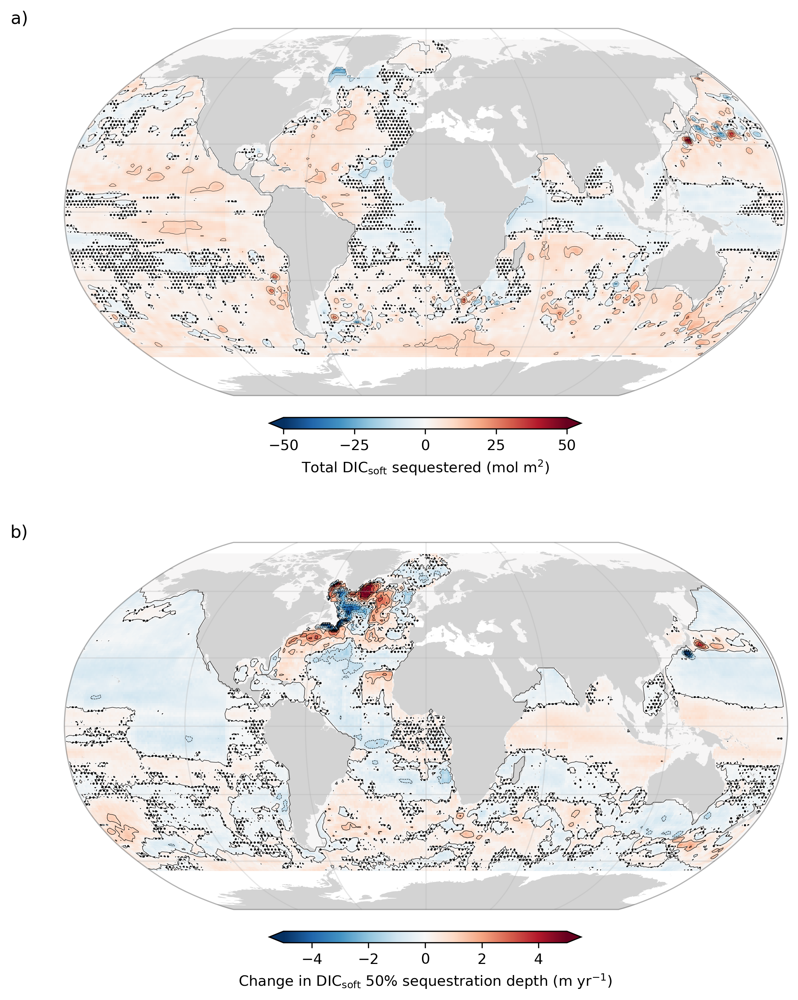

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import xarray as xr

# --- Define Mediterranean mask function ---
def mask_mediterranean(lat, lon):
    """
    Returns a boolean mask that is True over the Mediterranean Sea.
    """
    lat_min, lat_max = 30, 46
    lon_min, lon_max = -6, 37
    return (lat >= lat_min) & (lat <= lat_max) & (lon >= lon_min) & (lon <= lon_max)

# --- Load datasets ---
net_DIC_sequestration = xr.load_dataset('data/03_DIC_sequestration_below_winter_MLD_monte_carlo_online_1000_iterations.nc')
dic_nat_new_seq = xr.load_dataset("data/04bis_DIC_50depth_stats.nc")

# --- Extract coordinates ---
lon = net_DIC_sequestration.coords['lon'].values
lat = net_DIC_sequestration.coords['lat'].values
lon_2d, lat_2d = np.meshgrid(lon, lat)

# --- Extract data for top subplot ---
net_DIC_sequestration_data = net_DIC_sequestration["DIC_nat_sequestration"].values
uncertainty_data_2 = net_DIC_sequestration["DIC_nat_sequestration_uncertainty"].values

# --- Compute relative uncertainty (%)
relative_uncertainty_2 = (uncertainty_data_2 / np.abs(net_DIC_sequestration_data)) * 100
relative_uncertainty_2[np.isnan(relative_uncertainty_2)] = 0
threshold_2 = np.percentile(relative_uncertainty_2, 90)
high_uncertainty_mask_2 = relative_uncertainty_2 > threshold_2

# --- Mask Mediterranean for top plot ---
med_mask_1 = mask_mediterranean(lat_2d, lon_2d)
net_DIC_sequestration_data = np.where(med_mask_1, np.nan, net_DIC_sequestration_data)
high_uncertainty_mask_2 = np.where(med_mask_1, False, high_uncertainty_mask_2)

# --- Bottom subplot dataset ---
lon_new = dic_nat_new_seq.coords['lon'].values
lat_new = dic_nat_new_seq.coords['lat'].values
lon_2d_new, lat_2d_new = np.meshgrid(lon_new, lat_new)

dic_nat_new_seq_data = dic_nat_new_seq['Slope_per_year'].values
uncertainty_data_new = dic_nat_new_seq['Slope_uncertainty_per_year'].values

# --- Compute relative uncertainty ---
eps = np.finfo(float).eps
relative_uncertainty_new = (uncertainty_data_new / (np.abs(dic_nat_new_seq_data) + eps)) * 100
relative_uncertainty_new[np.isnan(relative_uncertainty_new)] = 0
threshold_new = np.percentile(relative_uncertainty_new, 90)
high_uncertainty_mask_new = relative_uncertainty_new > threshold_new

# --- Mask Mediterranean for bottom plot ---
med_mask_2 = mask_mediterranean(lat_2d_new, lon_2d_new)
dic_nat_new_seq_data = np.where(med_mask_2, np.nan, dic_nat_new_seq_data)
high_uncertainty_mask_new = np.where(med_mask_2, False, high_uncertainty_mask_new)

# --- Create figure ---
fig = plt.figure(figsize=(15, 11), dpi=300)

# --- First subplot: net_DIC_sequestration ---
ax1 = fig.add_subplot(2, 1, 1, projection=ccrs.Robinson())
ax1.set_global()
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax1.add_feature(land_feature)
ax1.gridlines(draw_labels=False, alpha=0.3)
ax1.text(-0.05, 1.05, 'a)', transform=ax1.transAxes, fontsize=12, va='top', ha='right')

norm1 = TwoSlopeNorm(vmin=-50, vcenter=0, vmax=50)
im1 = ax1.pcolormesh(lon_2d, lat_2d, net_DIC_sequestration_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm1)
ax1.contourf(lon_2d, lat_2d, high_uncertainty_mask_2, levels=[0.5, 1], colors='xkcd:pale grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())
levels = np.arange(-50, 50, 10)
ax1.contour(lon_2d, lat_2d, net_DIC_sequestration_data, levels=levels, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
cbar_ax1 = fig.add_axes([0.412, 0.53, 0.2, 0.01])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal', extend='both')
cbar1.set_label(r'Total DIC$_{\mathrm{soft}}$ sequestered (mol m$^{2}$)')
cbar1.set_ticks([50, 25, 0, -25, -50])
for spine in ax1.spines.values():
    spine.set_alpha(0.3)

# --- Second subplot: dic_nat_new_seq ---
ax2 = fig.add_subplot(2, 1, 2, projection=ccrs.Robinson())
ax2.set_global()
ax2.add_feature(land_feature)
ax2.gridlines(draw_labels=False, alpha=0.3)
ax2.text(-0.05, 1.05, 'b)', transform=ax2.transAxes, fontsize=12, va='top', ha='right')

norm2 = TwoSlopeNorm(vcenter=0, vmin=-5, vmax=5)
im2 = ax2.pcolormesh(lon_new, lat_new, dic_nat_new_seq_data, transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm2)
ax2.contourf(lon_2d_new, lat_2d_new, high_uncertainty_mask_new, levels=[0.5, 1], colors='xkcd:grey', hatches=['.....'], alpha=0.001, transform=ccrs.PlateCarree())
levels = np.arange(-5, 5, 1)
ax2.contour(lon_2d_new, lat_2d_new, dic_nat_new_seq_data, levels=levels, colors='black', linewidths=0.3, transform=ccrs.PlateCarree())
cbar_ax2 = fig.add_axes([0.412, 0.081, 0.2, 0.01])
cbar2 = fig.colorbar(im2, cax=cbar_ax2, orientation='horizontal', extend='both')
cbar2.set_label(r'Change in DIC$_{\mathrm{soft}}$ 50% sequestration depth (m yr$^{-1}$)')
for spine in ax2.spines.values():
    spine.set_alpha(0.3)

# --- Final layout and save ---
plt.subplots_adjust(hspace=0.4)
fig.savefig('figs/Figure3_with_two_subplots.png', bbox_inches='tight', dpi=300)
plt.show()


## Figure 4 - Spatial hotspots of coherent change

This script identifies and visualizes **spatial hotspots of coherent change** in the global ocean's biological carbon pump. Specifically, it highlights regions where both:

- The **depth at which 50% of soft-tissue-derived DIC is stored** is changing over time, and  
- The **total depth-integrated DIC sequestration below the winter mixed layer depth (MLD)** is increasing or decreasing in the same direction.

The goal is to isolate regions where **both metrics align** in their sign of change (either positive or negative), while accounting for uncertainty and excluding noisy or anomalous data.

---

**Workflow Overview**

- **Data Sources**
  - Loads two datasets:
    - One containing **temporal trends in the 50% sequestration depth** and its **uncertainty**.
    - One containing **total DIC sequestration below the winter MLD** and its **uncertainty**.
  - Extracts corresponding latitude/longitude grids and ensures longitudes are in the **-180 to 180° format**.

- **Uncertainty Filtering**
  - Computes **relative uncertainties (%)** for both datasets to assess the reliability of each grid point.
  - Applies a **90th percentile threshold** to mask regions with **high uncertainty** in either variable.

- **Outlier Removal**
  - Removes the **upper and lower 5% of values** (extremes) for both the DIC sequestration change and the depth trend.
  - This ensures focus on robust, central tendencies rather than statistical outliers.

- **Coherent Change Detection**
  - Identifies regions where **both metrics are increasing** ("positive-positive") or **both are decreasing** ("negative-negative").
  - Ensures that all selected regions:
    - Are within the central 90% of the value range.
    - Have **low uncertainty** in both metrics.
  - Assigns grid cells as either:
    - `1` (positive-positive),
    - `-1` (negative-negative), or
    - `NaN` (filtered out).

- **Visualization**
  - Uses a **custom binary colormap** to distinguish between:
    - **Positive-positive regions** (reddish),
    - **Negative-negative regions** (bluish),
    - Filtered-out areas (transparent).
  - Projects results on a **Robinson global map** with land features and subtle gridlines.
  - Saves the figure as a high-resolution PNG image.

---

The resulting map identifies **spatial hotspots where both the vertical structure and total magnitude of soft-tissue carbon storage are changing in tandem**.


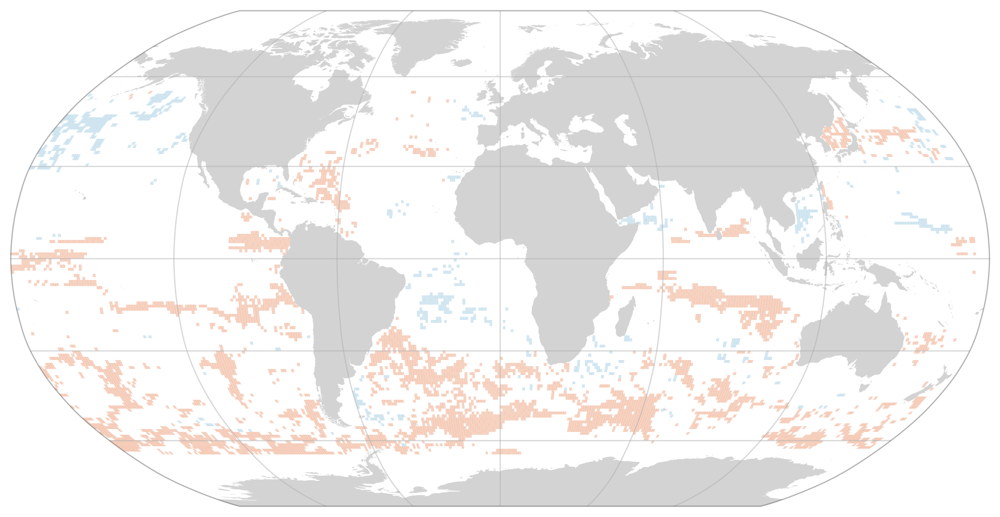

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

# --- Define Mediterranean mask function ---
def mask_mediterranean(lat, lon):
    """
    Returns a boolean mask that is True over the Mediterranean Sea.
    """
    lat_min, lat_max = 30, 46
    lon_min, lon_max = -6, 37
    return (lat >= lat_min) & (lat <= lat_max) & (lon >= lon_min) & (lon <= lon_max)

# --- Load datasets ---
dic_nat_new_seq = xr.load_dataset("data/04bis_DIC_50depth_stats.nc")
dic_nat_total_change = xr.load_dataset("data/03_DIC_sequestration_below_winter_MLD_monte_carlo_online_1000_iterations.nc")

# --- Extract coordinates ---
lat = dic_nat_new_seq.coords['lat'].values
lon = dic_nat_new_seq.coords['lon'].values
lon[lon > 180] -= 360
lon_2d, lat_2d = np.meshgrid(lon, lat)

# --- Extract data ---
slope_per_year = dic_nat_new_seq['Slope_per_year'].values
soft_pump_aou_change = dic_nat_total_change['DIC_nat_sequestration'].values

# --- Extract uncertainties ---
uncertainty_slope = dic_nat_new_seq['Slope_uncertainty_per_year'].values
uncertainty_soft_pump = dic_nat_total_change['DIC_nat_sequestration_uncertainty'].values

# --- Compute relative uncertainties (%)
eps = np.finfo(float).eps
relative_uncertainty_slope = (uncertainty_slope / (np.abs(slope_per_year) + eps)) * 100
relative_uncertainty_soft_pump = (uncertainty_soft_pump / (np.abs(soft_pump_aou_change) + eps)) * 100

# --- Handle NaNs
relative_uncertainty_slope = np.nan_to_num(relative_uncertainty_slope, nan=0)
relative_uncertainty_soft_pump = np.nan_to_num(relative_uncertainty_soft_pump, nan=0)

# --- Define high uncertainty threshold (90th percentile)
threshold_slope = np.percentile(relative_uncertainty_slope, 90)
threshold_soft_pump = np.percentile(relative_uncertainty_soft_pump, 90)

# --- Create boolean masks for uncertainty filtering
high_uncertainty_mask_slope = relative_uncertainty_slope > threshold_slope
high_uncertainty_mask_soft_pump = relative_uncertainty_soft_pump > threshold_soft_pump

# --- Remove extreme 10% values
slope_lower, slope_upper = np.nanpercentile(slope_per_year, [5, 95])
soft_pump_lower, soft_pump_upper = np.nanpercentile(soft_pump_aou_change, [5, 95])

# --- Create masks for positive-positive and negative-negative correlations
pos_mask = (
    (slope_per_year > 0) & (soft_pump_aou_change > 0) &
    (slope_per_year >= slope_lower) & (slope_per_year <= slope_upper) &
    (soft_pump_aou_change >= soft_pump_lower) & (soft_pump_aou_change <= soft_pump_upper) &
    (~high_uncertainty_mask_slope) & (~high_uncertainty_mask_soft_pump)
)

neg_mask = (
    (slope_per_year < 0) & (soft_pump_aou_change < 0) &
    (slope_per_year >= slope_lower) & (slope_per_year <= slope_upper) &
    (soft_pump_aou_change >= soft_pump_lower) & (soft_pump_aou_change <= soft_pump_upper) &
    (~high_uncertainty_mask_slope) & (~high_uncertainty_mask_soft_pump)
)

# --- Convert boolean masks into plot-friendly format
highlighted_areas = np.full_like(slope_per_year, np.nan)
highlighted_areas[pos_mask] = 1   # Red
highlighted_areas[neg_mask] = -1  # Blue

# --- Spatial mask: remove points above 55°N or beyond 175°E
spatial_mask = (lat_2d > 55) | (lon_2d > 175)
highlighted_areas[spatial_mask] = np.nan

# --- Apply Mediterranean Sea mask
med_mask = mask_mediterranean(lat_2d, lon_2d)
highlighted_areas[med_mask] = np.nan

# --- Define custom colormap
custom_cmap = ListedColormap(["#b7d7e8", "#f1b598"])  # Blue, Red
bounds = [-1, 0, 1]
norm = mcolors.BoundaryNorm(bounds, custom_cmap.N)

# --- Plotting
fig, ax = plt.subplots(figsize=(12, 6), dpi=300, subplot_kw={'projection': ccrs.Robinson()})
ax.set_global()

# Add land
land_feature = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='none', facecolor='lightgrey')
ax.add_feature(land_feature)
ax.gridlines(draw_labels=False, alpha=0.5)

# Plot highlights
ax.pcolormesh(lon_2d, lat_2d, highlighted_areas, cmap=custom_cmap, norm=norm, transform=ccrs.PlateCarree(), alpha=0.6)

# Fade frame
for spine in ax.spines.values():
    spine.set_alpha(0.3)

# Save figure
fig.savefig('figs/Figure4_sequestration_hotspots_filtered.png', bbox_inches='tight', dpi=300)
plt.show()
